In [8]:
import numpy as np
import support_functions as sf
import matplotlib.pyplot as plt

from glob import glob
from IPython import display
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

## Business Understanding
Om te zien waar het model daadwerkelijk op focussed is het interessant om een filmpje te maken van meerdere predict checkpoints tijdens de training. Om dit te bereiken wordt er in de callback een predict opgeslagen. Deze voorspelling wordt vervolgens achter elkaar geplakt en gevormt tot een video.

In deze notebook wordt er gebruik gemaakt van een bestaand model. Verdere details van de inhoud van dit model zijn terug te vinden in 'Grote_Training.ipynb'.

Goed om te weten is dat er gebruik is gemaakt van een callback functie tijdens de training die iedere vijf epochs een voorspelling uitvoert en opslaat. Deze voorspellingen worden in deze notebook ingeladen.

De business vraag die in dit notebook centraal staat luid als volgt: Is het mogelijk om meer inzicht te geven het verloop van een training naast een loss of accuracy, zodat een buitenstaander ook een begrip bij de progessie kan hebben?

## Evaluation
Als eerste is het handig om de individuele frames (voorspellingen) in te laden. Dit doen we door gebruik te maken van de 'glob' methode en de 'imread' methode. 

Goed om te onthouden is dat er een exclude list is toegevoegd. Deze is aangemaakt om te zorgen dat onnodige afbeeldingen niet mee worden genomen in het resultaat. Een onnodige afbeelding is bijvoorbeeld 'image.png'. Dit bestand is het orgineel van de CT-scan die vervolgens is gecorrumpeerd. Deze wordt in de 'Grote_Training.ipynb' notebook tevens in dezelfde map opgeslagen. Deze is echter niet van belang voor deze visualisatie, vandaar dat deze is uitgesloten

In [4]:
exclude=['models/visualisation_model/image.png','models/visualisation_model/image_corrupt.png']
reconstructed = glob('models/visualisation_model/*.png')
reconstructed = [r for r in reconstructed if r not in exclude]
reconstructed.sort()

images = []
for image_path in reconstructed:
    im = plt.imread(image_path)
    images.append(plt.imread(image_path))
images = np.array(images)

Nu we de individuele frames (voorspellingen) hebben ingeladen, kunnen deze achter elkaar worden geplaatst en worden gevormt tot een video. Dit wordt gedaan door onderstaande code. Er wordt hier gebruik gemaakt van de FuncAnimation methode van matplotlib

In [50]:
def load_training_images(images_folder:str) -> np.array:
    exclude=[images_folder+'/image.png', images_folder+'/image_corrupt.png']
    reconstructed = glob(images_folder + '/*.png')
    reconstructed = [r for r in reconstructed if r not in exclude]
    reconstructed.sort(reverse=False)
    reconstructed.insert(0, glob(images_folder + '/image_corrupt.png')[0])

    images = []
    for image_path in reconstructed:
        im = plt.imread(image_path)
        images.append(plt.imread(image_path))
    images = np.array(images)
    return images, reconstructed

def animate_model_training(images_folder:str, video_path:str=''):
    
    images, titles = load_training_images(images_folder)
    figure = plt.figure()

    lines_plotted = plt.imshow(images[0], cmap=plt.cm.gray)    

    def show_animation(frame: np.array):
        plt.imshow(images[frame], cmap=plt.cm.gray)
        plt.axis('off')
        if frame==0:
            plt.title('corrupt image')
        elif frame==1:
            plt.title('epoch: 0')
        else:
            title = titles[frame].replace(images_folder + '/', '')
            title = title.replace('.png', '')
            title = title.lstrip('0')
            plt.title('epoch: ' + str(title))

    anim = FuncAnimation(figure, show_animation, frames=images.shape[0], interval=500)

    writervideo = animation.FFMpegWriter(fps=2)
    if video_path != '':
        anim.save(video_path, writervideo)

    video = anim.to_jshtml()
    html = display.HTML(video)
    display.display(html)

    plt.close()

Het is niet erg overzichtelijk om de bovenstaande code in iedere notebook te plaatsen. Daarom is er voor gekozen om deze code om te bouwen naar een functie en deze in de support_functions.py file te localiseren. Hieronder zijn de definitieve functies te vinden.

##### Vervolgens is de Animate_Model_Training functie aan te roepen op de volgende twee wijzen:
##### 1. De eerste optie zorgt ervoor dat de video enkel wordt getoont. Hierbij wordt alleen de folder meegegeven waar de .png bestanden in staan (de opgeslagen images). Dit resulteert enkel in een getoonde visualisatie van de training. Echter, dit resulteert NIET in het opslaan van de visualisatie.
##### 2. De tweede optie zorgt ervoor dat de video zowel wordt getoont als wordt opgeslagen. Hierbij wordt zowel de folder meegegeven waar de .png bestanden in staan (opgeslagen images) als het exacte pad van opslaan.

AttributeError: 'FuncAnimation' object has no attribute 'FFMpegWriter'

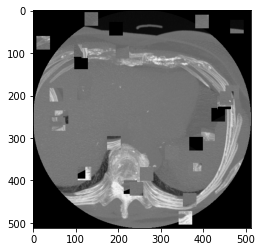

In [9]:
sf.Animate_Model_Training(images_folder='models/groot_model_LR_0.001_3')

In [51]:
animate_model_training(images_folder='models/groot_model_LR_0.001_3', video_path='videos/groot_1_langzaam.mp4')

In [49]:
animate_model_training(images_folder='models/groot_model_LR_0.001_3', video_path='videos/groot_1.mp4')

In [47]:
animate_model_training(images_folder='models/medium_model_LR_0.001_3', video_path='videos/medium_1.mp4')

In [36]:
animate_model_training(images_folder='models/visualisation_model', video_path='videos/TrainingsVideo.mp4')

In [15]:
#1
Animate_Model_Training(images_folder='models/visualisation_model')

In [19]:
Animate_Model_Training(images_folder='models/visualisation_model')

In [ ]:
#2
Animate_Model_Training(images_folder='models/groot_model_LR_0.002_', video_path='videos/TrainingsVideo.mp4')